In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tpu-getting-started/sample_submission.csv
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/09-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/14-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/01-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/13-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/00-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/07-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/12-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/11-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/05-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/04-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecords-jpeg-224x224/val/15-224x224-232.tfrec
/kaggle/input/tpu-getting-started/tfrecord

**Import**

In [2]:
import math, re, os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
print("Tensorflow version " + tf.__version__)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Tensorflow version 2.13.0


Tensor processing unit (TPU) can be used to speed up operations associated with machine learning. TensorFlow is configured to use a TPU if one is discovered, establishing the required connections and training techniques across TPU cores. By default, it uses the resources of the local computer if there is no TPU available. The amount of TPU cores being used for training is indicated by the number of replicas in sync.

In [3]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver() 
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy() 

print("REPLICAS: ", strategy.num_replicas_in_sync)

REPLICAS:  1


**Loading Dataset**

In [4]:
from kaggle_datasets import KaggleDatasets
GCS_DS_PATH = KaggleDatasets().get_gcs_path()
print(GCS_DS_PATH)

gs://kds-163f79a0b36229ddbdee82c71aa129d3ea537863c839f4dd9fcf46e2


I have choosen 224 X 224 resolution as my image size, And my batch size is 16 The code also defines paths for training, validation, and test datasets in TFRecord format, along with a list of flower classes. The classes represent different types of flowers, and the code is used for image classification tasks with these specific classes.

In [5]:
IMAGE_SIZE = [224,224]
BATCH_SIZE = 16 * strategy.num_replicas_in_sync

GCS_PATH_SELECT = {
    192: GCS_DS_PATH + '/tfrecords-jpeg-192x192',
    224: GCS_DS_PATH + '/tfrecords-jpeg-224x224',
    331: GCS_DS_PATH + '/tfrecords-jpeg-331x331',
    512: GCS_DS_PATH + '/tfrecords-jpeg-512x512',
}
GCS_PATH = GCS_PATH_SELECT[IMAGE_SIZE[0]]

TRAINING_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/train/*.tfrec')
VALIDATION_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/val/*.tfrec')
TEST_FILENAMES = tf.io.gfile.glob(GCS_PATH + '/test/*.tfrec')

CLASSES = ['pink primrose',    'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea',     'wild geranium',     'tiger lily',           'moon orchid',              'bird of paradise', 'monkshood',        'globe thistle',         # 00 - 09
           'snapdragon',       "colt's foot",               'king protea',      'spear thistle', 'yellow iris',       'globe-flower',         'purple coneflower',        'peruvian lily',    'balloon flower',   'giant white arum lily', # 10 - 19
           'fire lily',        'pincushion flower',         'fritillary',       'red ginger',    'grape hyacinth',    'corn poppy',           'prince of wales feathers', 'stemless gentian', 'artichoke',        'sweet william',         # 20 - 29
           'carnation',        'garden phlox',              'love in the mist', 'cosmos',        'alpine sea holly',  'ruby-lipped cattleya', 'cape flower',              'great masterwort', 'siam tulip',       'lenten rose',           # 30 - 39
           'barberton daisy',  'daffodil',                  'sword lily',       'poinsettia',    'bolero deep blue',  'wallflower',           'marigold',                 'buttercup',        'daisy',            'common dandelion',      # 40 - 49
           'petunia',          'wild pansy',                'primula',          'sunflower',     'lilac hibiscus',    'bishop of llandaff',   'gaura',                    'geranium',         'orange dahlia',    'pink-yellow dahlia',    # 50 - 59
           'cautleya spicata', 'japanese anemone',          'black-eyed susan', 'silverbush',    'californian poppy', 'osteospermum',         'spring crocus',            'iris',             'windflower',       'tree poppy',            # 60 - 69
           'gazania',          'azalea',                    'water lily',       'rose',          'thorn apple',       'morning glory',        'passion flower',           'lotus',            'toad lily',        'anthurium',             # 70 - 79
           'frangipani',       'clematis',                  'hibiscus',         'columbine',     'desert-rose',       'tree mallow',          'magnolia',                 'cyclamen ',        'watercress',       'canna lily',            # 80 - 89
           'hippeastrum ',     'bee balm',                  'pink quill',       'foxglove',      'bougainvillea',     'camellia',             'mallow',                   'mexican petunia',  'bromelia',         'blanket flower',        # 90 - 99
           'trumpet creeper',  'blackberry lily',           'common tulip',     'wild rose']                                                            

****AUTOTUNE****
This function helps to automatically determines the optimal number of parallel processes for data loading and preprocessing.

In [6]:
AUTO = tf.data.experimental.AUTOTUNE

In [7]:
def decode_image(image_data):
    image = tf.image.decode_jpeg(image_data, channels=3)
    image = tf.cast(image, tf.float32) / 255.0  
    image = tf.reshape(image, [*IMAGE_SIZE, 3]) 
    return image

def read_labeled_tfrecord(example):
    LABELED_TFREC_FORMAT = {"image": tf.io.FixedLenFeature([], tf.string),"class": tf.io.FixedLenFeature([], tf.int64),  }
    example = tf.io.parse_single_example(example, LABELED_TFREC_FORMAT)
    image = decode_image(example['image'])
    label = tf.cast(example['class'], tf.int32)
    return image, label 

def read_unlabeled_tfrecord(example):
    UNLABELED_TFREC_FORMAT = {"image": tf.io.FixedLenFeature([], tf.string),"id": tf.io.FixedLenFeature([], tf.string)}
    example = tf.io.parse_single_example(example, UNLABELED_TFREC_FORMAT)
    image = decode_image(example['image'])
    idnum = example['id']
    return image, idnum 

def load_dataset(filenames, labeled=True, ordered=False):
    
    ignore_order = tf.data.Options()
    if not ordered:
        ignore_order.experimental_deterministic = False 
    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO) 
    dataset = dataset.with_options(ignore_order) 
    dataset = dataset.map(read_labeled_tfrecord if labeled else read_unlabeled_tfrecord, num_parallel_calls=AUTO)
    return dataset

In [8]:
def data_augment_train(image, label):
    image = tf.image.resize(image, [224,224])
    image = tf.image.random_flip_left_right(image)
    return image, label 

def data_augment_test_val(image, label):
    image = tf.image.resize(image, [224,224])
    return image, label   

def get_training_dataset():
    dataset = load_dataset(TRAINING_FILENAMES, labeled=True)
    dataset = dataset.map(data_augment_train, num_parallel_calls=AUTO)
    dataset = dataset.repeat() # the training dataset must repeat for several epochs
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

def get_validation_dataset(ordered=False):
    dataset = load_dataset(VALIDATION_FILENAMES, labeled=True, ordered=ordered)
    dataset = dataset.map(data_augment_test_val, num_parallel_calls=AUTO)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.cache()
    dataset = dataset.prefetch(AUTO)
    return dataset

def get_test_dataset(ordered=False):
    dataset = load_dataset(TEST_FILENAMES, labeled=False, ordered=ordered)
    dataset = dataset.map(data_augment_test_val, num_parallel_calls=AUTO)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO)
    return dataset

def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

NUM_TRAINING_IMAGES = count_data_items(TRAINING_FILENAMES)
NUM_VALIDATION_IMAGES = count_data_items(VALIDATION_FILENAMES)
NUM_TEST_IMAGES = count_data_items(TEST_FILENAMES)
print('Dataset: {} training images, {} validation images, {} unlabeled test images'.format(NUM_TRAINING_IMAGES, NUM_VALIDATION_IMAGES, NUM_TEST_IMAGES))

Dataset: 12753 training images, 3712 validation images, 7382 unlabeled test images


In [9]:
BATCH_SIZE = 16 * strategy.num_replicas_in_sync

ds_train = get_training_dataset()
ds_valid = get_validation_dataset()
ds_test = get_test_dataset()

print("Training:", ds_train)
print ("Validation:", ds_valid)
print("Test:", ds_test)

Training: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
Validation: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>
Test: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>


In [10]:
np.set_printoptions(threshold=15, linewidth=80)

print("Train data shapes:")
for image, idnum in ds_train.take(3):
    print(image.numpy().shape, idnum.numpy().shape)
print("Train data IDs:", idnum.numpy().astype('U'))

Train data shapes:
(16, 224, 224, 3) (16,)
(16, 224, 224, 3) (16,)
(16, 224, 224, 3) (16,)
Train data IDs: ['48' '79' '103' ... '45' '11' '67']


In [11]:
print("Test data shapes:")
for image, idnum in ds_test.take(3):
    print(image.numpy().shape, idnum.numpy().shape)
print("Test data IDs:", idnum.numpy().astype('U'))

Test data shapes:
(16, 224, 224, 3) (16,)
(16, 224, 224, 3) (16,)
(16, 224, 224, 3) (16,)
Test data IDs: ['8d53d2814' '1ee5a55be' '0435e3c70' ... '54493a1bd' 'c145a87d1' '336577848']


In [12]:
from matplotlib import pyplot as plt

def batch_to_numpy_images_and_labels(data):
    images, labels = data
    numpy_images = images.numpy()
    numpy_labels = labels.numpy()
    if numpy_labels.dtype == object:numpy_labels = [None for _ in enumerate(numpy_images)]
    return numpy_images, numpy_labels

def title_from_label_and_target(label, correct_label):
    if correct_label is None:
        return CLASSES[label], True
    correct = (label == correct_label)
    return "{} [{}{}{}]".format(CLASSES[label], 'OK' if correct else 'NO', u"\u2192" if not correct else '',
                                CLASSES[correct_label] if not correct else ''), correct

def display_one_flower(image, title, subplot, red=False, titlesize=16):
    plt.subplot(*subplot)
    plt.axis('off')
    plt.imshow(image)
    if len(title) > 0:
        plt.title(title, fontsize=int(titlesize) if not red else int(titlesize/1.2), color='red' if red else 'black', fontdict={'verticalalignment':'center'}, pad=int(titlesize/1.5))
    return (subplot[0], subplot[1], subplot[2]+1)
    
def display_batch_of_images(databatch, predictions=None):
    """This will work with:
    display_batch_of_images(images)
    display_batch_of_images(images, predictions)
    display_batch_of_images((images, labels))
    display_batch_of_images((images, labels), predictions)
    """
    # data
    images, labels = batch_to_numpy_images_and_labels(databatch)
    if labels is None:
        labels = [None for _ in enumerate(images)]
    rows = int(math.sqrt(len(images)))
    cols = len(images)//rows
        
    # size and spacing
    FIGSIZE = 13.0
    SPACING = 0.1
    subplot=(rows,cols,1)
    if rows < cols:
        plt.figure(figsize=(FIGSIZE,FIGSIZE/cols*rows))
    else:
        plt.figure(figsize=(FIGSIZE/rows*cols,FIGSIZE))
    
    # display
    for i, (image, label) in enumerate(zip(images[:rows*cols], labels[:rows*cols])):
        title = '' if label is None else CLASSES[label]
        correct = True
        if predictions is not None:
            title, correct = title_from_label_and_target(predictions[i], label)
        dynamic_titlesize = FIGSIZE*SPACING/max(rows,cols)*40+3 # magic formula tested to work from 1x1 to 10x10 images
        subplot = display_one_flower(image, title, subplot, not correct, titlesize=dynamic_titlesize)
    
    #layout
    plt.tight_layout()
    if label is None and predictions is None:
        plt.subplots_adjust(wspace=0, hspace=0)
    else:
        plt.subplots_adjust(wspace=SPACING, hspace=SPACING)
    plt.show()


def display_training_curves(training, validation, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])


In [13]:
ds_iter = iter(ds_train.unbatch().batch(20))

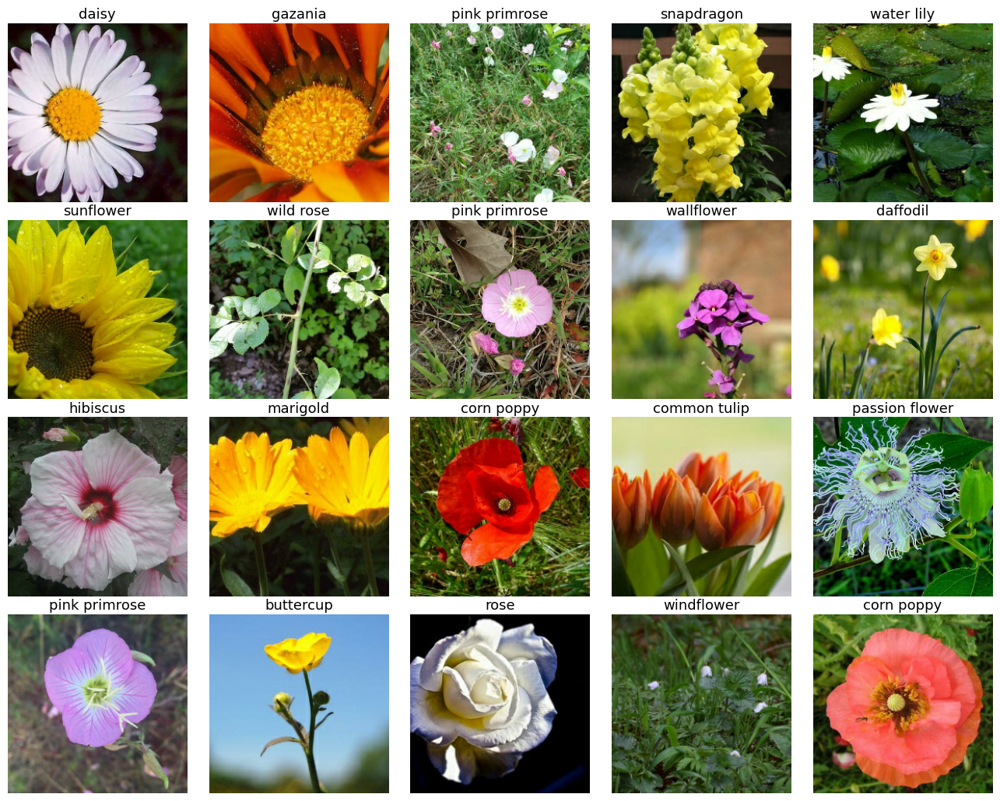

In [14]:
one_batch = next(ds_iter)
display_batch_of_images(one_batch)

**Modeling**

**ResNet50 model**
this model has been reffred by the link below. 

Ref: https://www.kaggle.com/code/sandy1112/petals-meet-resnet50-built-and-retrained-on-tpu

In [15]:
EPOCHS = 50
from tensorflow.keras.models import Model
with strategy.scope():
    pretrained_model = tf.keras.applications.resnet50.ResNet50(weights='imagenet',include_top=False ,input_shape=[*IMAGE_SIZE, 3],pooling='avg',)
    pretrained_model.trainable = True
    x = pretrained_model.output
    predictions = tf.keras.layers.Dense(len(CLASSES), activation='softmax')(x)
    model = tf.keras.models.Model(inputs=pretrained_model.input, outputs=predictions)

94765736/94765736 [==============================] - 3s 0us/step


In [16]:
model.compile(optimizer='nadam',loss = 'sparse_categorical_crossentropy',metrics=['sparse_categorical_accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [17]:
model.input

<KerasTensor: shape=(None, 224, 224, 3) dtype=float32 (created by layer 'input_1')>

Learning rate schedule: 1e-05 to 5e-05 to 1e-05


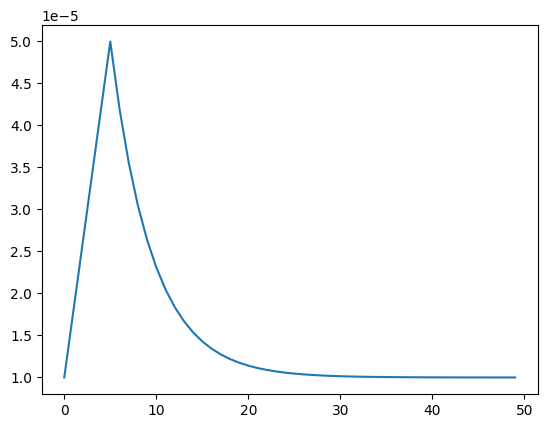

In [18]:
def exponential_lr(epoch,start_lr = 0.00001, min_lr = 0.00001, max_lr = 0.00005,rampup_epochs = 5, sustain_epochs = 0,exp_decay = 0.8):
    def lr(epoch, start_lr, min_lr, max_lr, rampup_epochs, sustain_epochs, exp_decay):
        # linear increase from start to rampup_epochs
        if epoch < rampup_epochs:
            lr = ((max_lr - start_lr) /
                  rampup_epochs * epoch + start_lr)
        # constant max_lr during sustain_epochs
        elif epoch < rampup_epochs + sustain_epochs:
            lr = max_lr
        # exponential decay towards min_lr
        else:
            lr = ((max_lr - min_lr)*exp_decay**(epoch - rampup_epochs - sustain_epochs) +min_lr)
        return lr
    return lr(epoch,start_lr,min_lr,max_lr,rampup_epochs,sustain_epochs,exp_decay)

lr_callback = tf.keras.callbacks.LearningRateScheduler(exponential_lr, verbose=True)

rng = [i for i in range(EPOCHS)]
y = [exponential_lr(x) for x in rng]
plt.plot(rng, y)
print("Learning rate schedule: {:.3g} to {:.3g} to {:.3g}".format(y[0], max(y), y[-1]))

In [19]:
EPOCHS = 5
STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE

history = model.fit(ds_train,
    validation_data=ds_valid,
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    callbacks=[lr_callback],
)


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/5
797/797 [==============================] - 183s 143ms/step - loss: 2.2623 - sparse_categorical_accuracy: 0.4428 - val_loss: 3.5853 - val_sparse_categorical_accuracy: 0.2045 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0008100000379979611.
Epoch 2/5
797/797 [==============================] - 108s 135ms/step - loss: 1.1110 - sparse_categorical_accuracy: 0.6953 - val_loss: 2.2527 - val_sparse_categorical_accuracy: 0.4736 - lr: 8.1000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005060000335611404.
Epoch 3/5
797/797 [==============================] - 107s 134ms/step - loss: 0.6209 - sparse_categorical_accuracy: 0.8277 - val_loss: 1.1778 - val_sparse_categorical_accuracy: 0.6778 - lr: 5.0600e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.00023240000449121004.
Epoch 4/5
797/797 [==============================] - 107s 135ms/step - loss: 0.2942

/tmp/ipykernel_47/3984881499.py:73: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


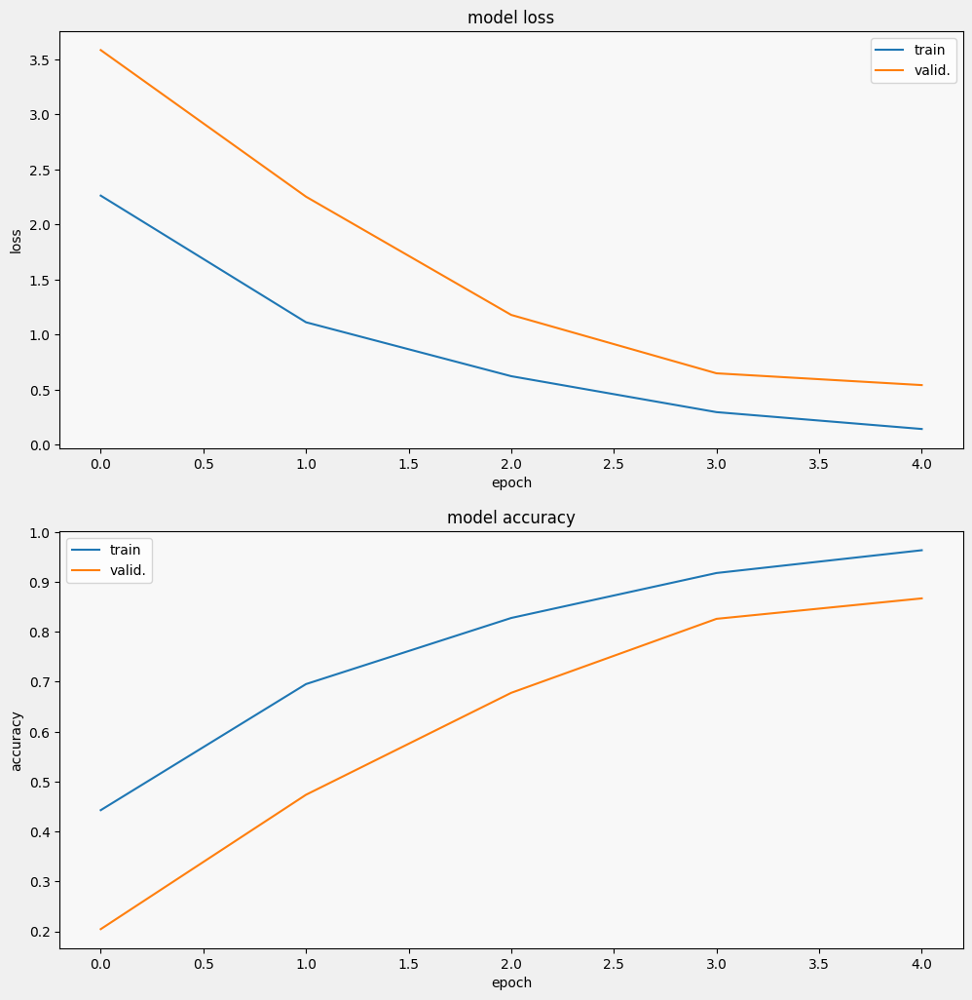

In [20]:
display_training_curves(history.history['loss'],history.history['val_loss'],'loss',211)
display_training_curves(history.history['sparse_categorical_accuracy'],history.history['val_sparse_categorical_accuracy'],'accuracy',212)

In [21]:
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

def display_confusion_matrix(cmat, score, precision, recall):
    plt.figure(figsize=(15,15))
    ax = plt.gca()
    ax.matshow(cmat, cmap='Reds')
    ax.set_xticks(range(len(CLASSES)))
    ax.set_xticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_xticklabels(), rotation=45, ha="left", rotation_mode="anchor")
    ax.set_yticks(range(len(CLASSES)))
    ax.set_yticklabels(CLASSES, fontdict={'fontsize': 7})
    plt.setp(ax.get_yticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    titlestring = ""
    if score is not None:
        titlestring += 'f1 = {:.3f} '.format(score)
    if precision is not None:
        titlestring += '\nprecision = {:.3f} '.format(precision)
    if recall is not None:
        titlestring += '\nrecall = {:.3f} '.format(recall)
    if len(titlestring) > 0:
        ax.text(101, 1, titlestring, fontdict={'fontsize': 18, 'horizontalalignment':'right', 'verticalalignment':'top', 'color':'#804040'})
    plt.show()
    
def display_training_curves(training, validation, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    #ax.set_ylim(0.28,1.05)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

In [22]:
cmdataset = get_validation_dataset(ordered=True)
images_ds = cmdataset.map(lambda image, label: image)
labels_ds = cmdataset.map(lambda image, label: label).unbatch()

cm_correct_labels = next(iter(labels_ds.batch(NUM_VALIDATION_IMAGES))).numpy()
cm_probabilities = model.predict(images_ds)
cm_predictions = np.argmax(cm_probabilities, axis=-1)

labels = range(len(CLASSES))
cmat = confusion_matrix(cm_correct_labels,cm_predictions,labels=labels,)
cmat = (cmat.T / cmat.sum(axis=1)).T # normalize

232/232 [==============================] - 9s 29ms/step


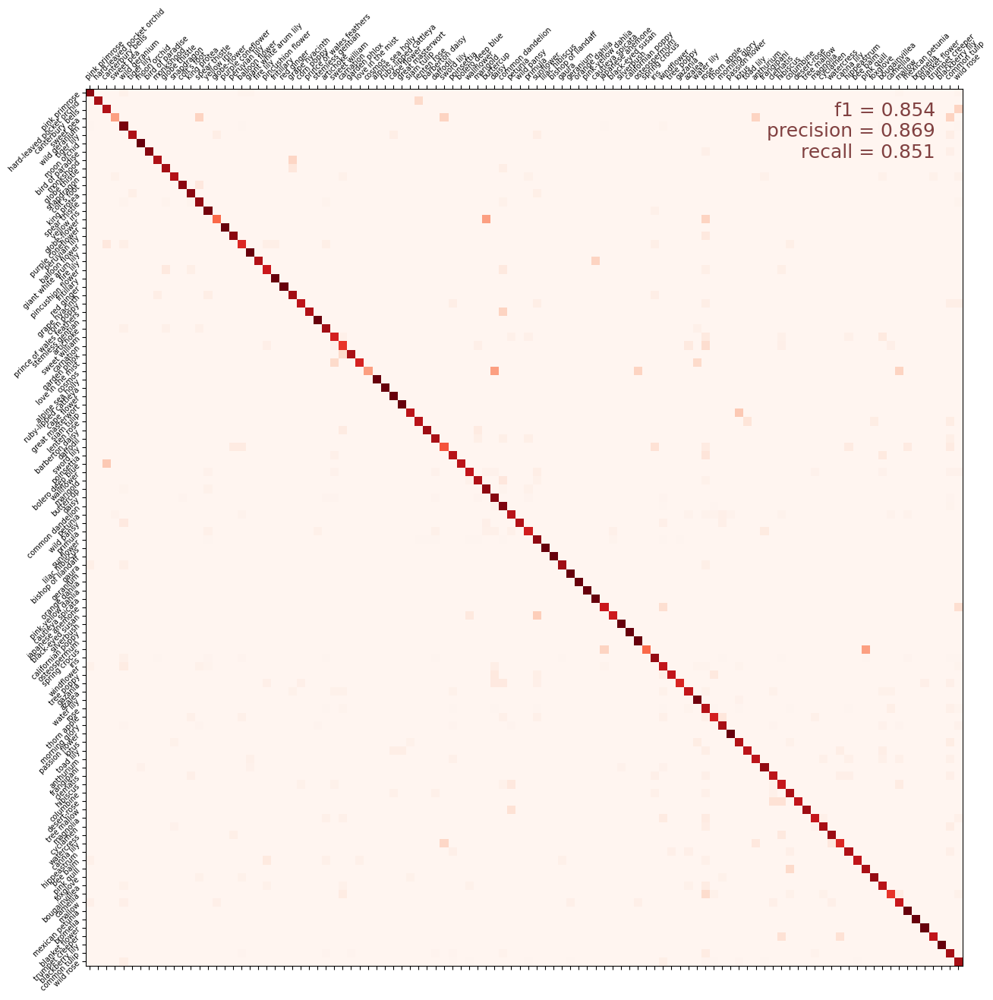

In [23]:
score = f1_score(cm_correct_labels,cm_predictions,labels=labels,average='macro',)
precision = precision_score(cm_correct_labels,cm_predictions,labels=labels,average='macro',)
recall = recall_score(cm_correct_labels,cm_predictions,labels=labels,average='macro',)
display_confusion_matrix(cmat, score, precision, recall)

In [24]:
dataset = get_validation_dataset()
dataset = dataset.unbatch().batch(20)
batch = iter(dataset)

Validatation

1/1 [==============================] - 1s 574ms/step


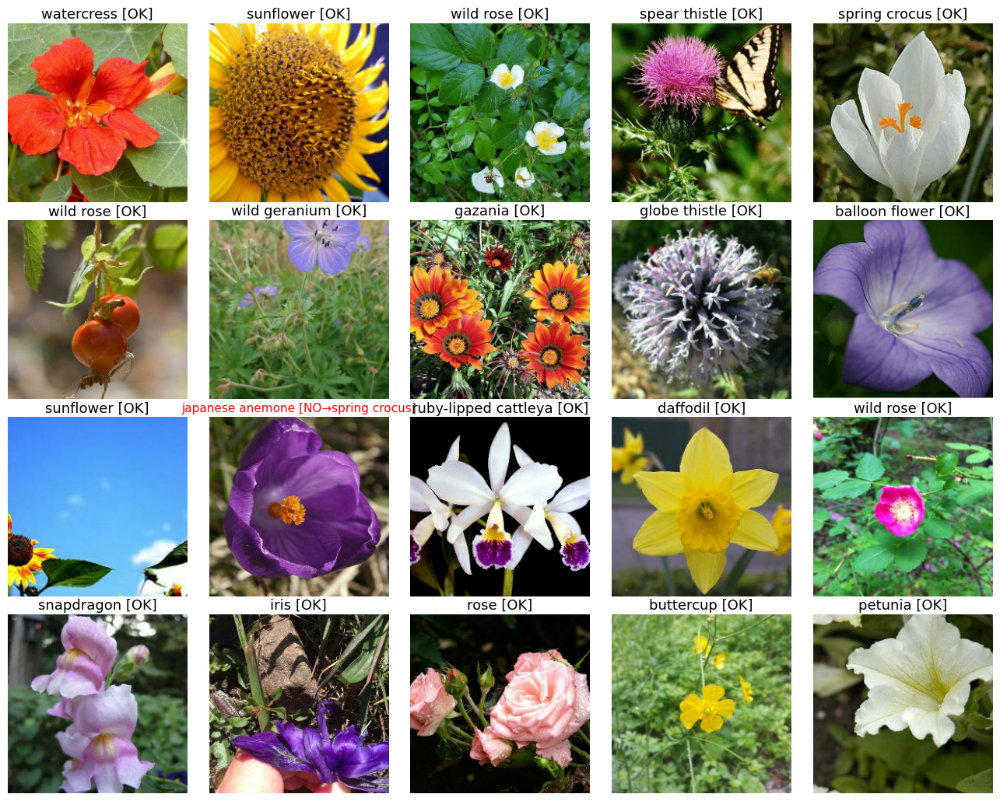

In [25]:
images, labels = next(batch)
probabilities = model.predict(images)
predictions = np.argmax(probabilities, axis=-1)
display_batch_of_images((images, labels), predictions)

In [26]:
test_ds = get_test_dataset(ordered=True)
print('Computing predictions...')
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = model.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

Computing predictions...
462/462 [==============================] - 16s 29ms/step
[67 28 45 ... 18 94 62]


**Performance Report of Xception and ResNet50 model**

The graph ploted here is compared traning loss and Validation loss of the Xception model vs Resnet50graph. 

1/1 [==============================] - 0s 25ms/step


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector)

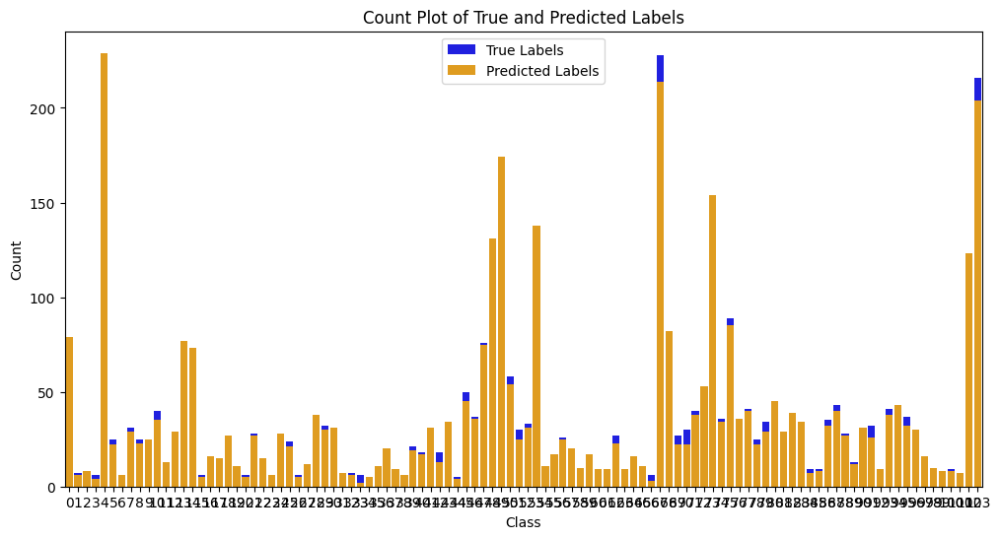

In [42]:
validation_dataset = get_validation_dataset()
validation_dataset = validation_dataset.unbatch().batch(20)
batch_iterator = iter(validation_dataset)
true_labels = []
predicted_labels = []
for batch in batch_iterator:
    images, labels = batch
    true_labels.extend(labels.numpy())
    probabilities = model.predict(images)
    predicted_labels.extend(np.argmax(probabilities, axis=-1))
class_names = [str(i) for i in range(len(CLASSES))]  
# bar graph
plt.figure(figsize=(12, 6))
sns.countplot(x=true_labels, color='blue', label='True Labels')
sns.countplot(x=predicted_labels, color='orange', label='Predicted Labels')
plt.title('Count Plot of True and Predicted Labels')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(ticks=range(len(class_names)), labels=class_names)
plt.legend()
plt.show()


confusion matrix and accuracy vizualzation

1/1 [==============================] - 0s 26ms/step


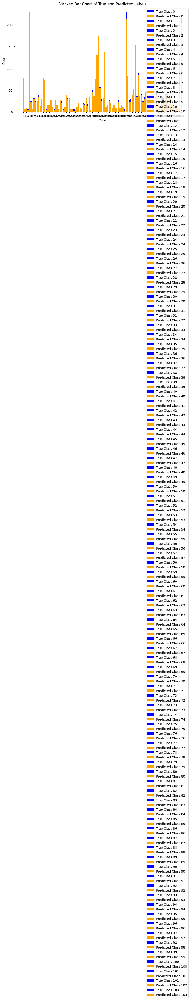

In [44]:
validation_dataset = get_validation_dataset()
validation_dataset = validation_dataset.unbatch().batch(20)
batch_iterator = iter(validation_dataset)
true_labels = []
predicted_labels = []
for batch in batch_iterator:
    images, labels = batch
    true_labels.extend(labels.numpy())
    probabilities = model.predict(images)
    predicted_labels.extend(np.argmax(probabilities, axis=-1))
    
accuracy = accuracy_score(true_labels, predicted_labels) # Calculate accuracy
class_names = [str(i) for i in range(len(CLASSES))] 
true_counts = np.bincount(true_labels, minlength=len(class_names))
predicted_counts = np.bincount(predicted_labels, minlength=len(class_names))

# bar chart
fig, ax = plt.subplots(figsize=(10, 6))
bottom = np.zeros(len(class_names))

for i in range(len(class_names)):
    ax.bar(class_names[i], true_counts[i], label=f'True Class {class_names[i]}', bottom=bottom[i], color='blue')
    ax.bar(class_names[i], predicted_counts[i], label=f'Predicted Class {class_names[i]}', bottom=bottom[i], color='orange')
ax.set_title('Stacked Bar Chart of True and Predicted Labels')
ax.set_xlabel('Class')
ax.set_ylabel('Count')
ax.legend()
plt.show()


**SUBMISSION**

In [28]:
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U')
df = {'id':test_ids,'label':predictions}
df = pd.DataFrame(df)
df.head()
df.to_csv('submission.csv',index=False)

**Xception model**
I have coded for this model

In [29]:
with strategy.scope():
    pretrained_model = tf.keras.applications.Xception(include_top=False,weights="imagenet",input_tensor=None,input_shape=[*IMAGE_SIZE, 3],pooling=None,classes=1000,classifier_activation="softmax")
    pretrained_model.trainable = False
    Xception_model = tf.keras.Sequential([pretrained_model,tf.keras.layers.GlobalAveragePooling2D(),tf.keras.layers.Dense(104, activation='softmax'),tf.keras.layers.Dropout(0.2)])

Xception_model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['sparse_categorical_accuracy'])
history = Xception_model.fit(ds_train,validation_data=ds_valid,epochs=5,steps_per_epoch=STEPS_PER_EPOCH,callbacks=[lr_callback])

83683744/83683744 [==============================] - 3s 0us/step

Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/5
797/797 [==============================] - 53s 57ms/step - loss: 4.4327 - sparse_categorical_accuracy: 0.4568 - val_loss: 1.3612 - val_sparse_categorical_accuracy: 0.6387 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0008100000379979611.
Epoch 2/5
797/797 [==============================] - 45s 56ms/step - loss: 3.5114 - sparse_categorical_accuracy: 0.5884 - val_loss: 1.1297 - val_sparse_categorical_accuracy: 0.7085 - lr: 8.1000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005060000335611404.
Epoch 3/5
797/797 [==============================] - 45s 56ms/step - loss: 3.3502 - sparse_categorical_accuracy: 0.6249 - val_loss: 1.0532 - val_sparse_categorical_accuracy: 0.7252 - lr: 5.0600e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.00023240000449121004.
Epoch 4/5
797/797 [=====

Validation for Xception model

1/1 [==============================] - 1s 1s/step


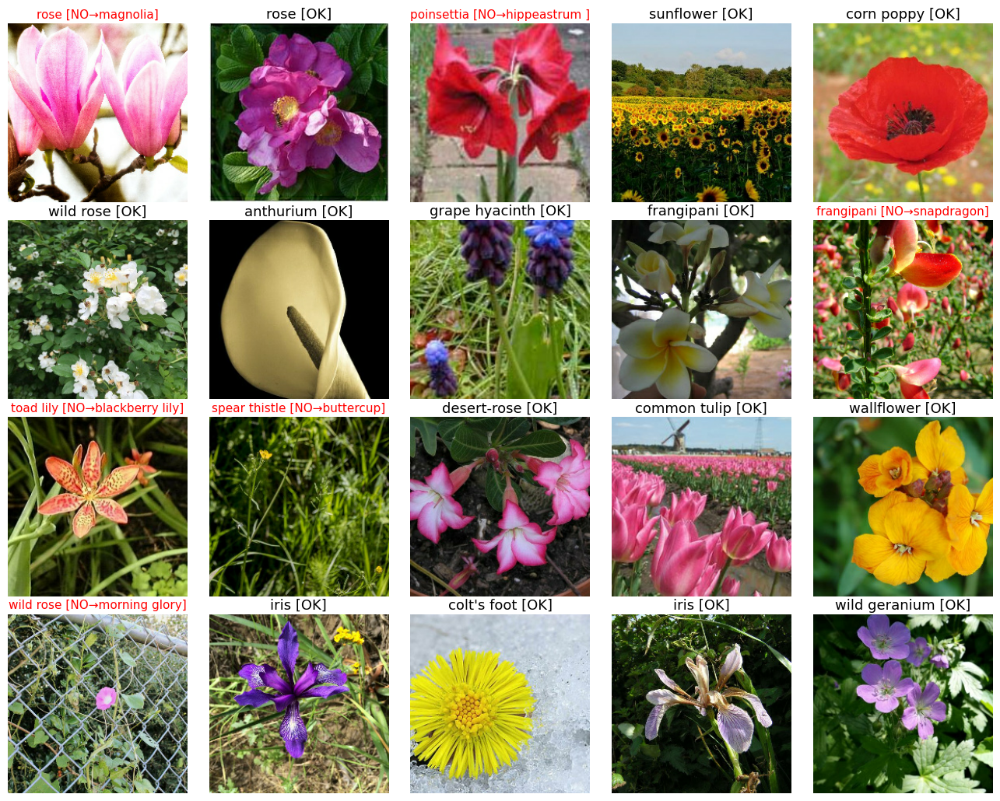

In [30]:
images, labels = next(batch)
probabilities = Xception_model.predict(images)
predictions = np.argmax(probabilities, axis=-1)
display_batch_of_images((images, labels), predictions)


In [31]:
test_ds = get_test_dataset(ordered=True)
print('Computing predictions...')
test_images_ds = test_ds.map(lambda image, idnum: image)
probabilities = Xception_model.predict(test_images_ds)
predictions = np.argmax(probabilities, axis=-1)
print(predictions)

Computing predictions...
462/462 [==============================] - 20s 38ms/step
[67 28 88 ... 67 94 62]


Submission.csv

In [32]:
test_ids_ds = test_ds.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U')
df = {'id':test_ids,'label':predictions}
df = pd.DataFrame(df)
df.head()
df.to_csv('submission.csv',index=False)